# Climate Data 

In [1]:
from gurobipy import *
import time
import pandas as pd

In [48]:
hw85 = pd.read_csv( r"C:\\Users\\NLLIST\\OneDrive - Sweco AB\\Thesis\\Climate data\\rcp85\\hotdays.csv", delimiter=',' , header=None)
hr85 = pd.read_csv( r"C:\\Users\\NLLIST\\OneDrive - Sweco AB\\Thesis\\Climate data\\rcp85\\mediumrain.csv", delimiter=',' , header=None)
sp85=  pd.read_csv( r"C:\Users\NLLIST\OneDrive - Sweco AB\Thesis\Climate data\rcp85\sunpeak.csv", delimiter=' ' , header=None)

hw45 = pd.read_csv( r"C:\\Users\\NLLIST\\OneDrive - Sweco AB\\Thesis\\Climate data\\rcp45\\hotdays.csv", delimiter=',' , header=None)
hr45 = pd.read_csv( r"C:\\Users\\NLLIST\\OneDrive - Sweco AB\\Thesis\\Climate data\\rcp45\\mediumrain.csv", delimiter=',' , header=None)
sp45 =  pd.read_csv( r"C:\Users\NLLIST\OneDrive - Sweco AB\Thesis\Climate data\rcp45\sunpeak.csv", delimiter=' ' , header=None)

hw26 = pd.read_csv( r"C:\\Users\\NLLIST\\OneDrive - Sweco AB\\Thesis\\Climate data\\rcp26\\hotdays.csv", delimiter=',' , header=None)
hr26 = pd.read_csv( r"C:\\Users\\NLLIST\\OneDrive - Sweco AB\\Thesis\\Climate data\\rcp26\\mediumrain.csv", delimiter=',' , header=None)
sp26 =  pd.read_csv( r"C:\Users\NLLIST\OneDrive - Sweco AB\Thesis\Climate data\rcp26\sunpeak.csv", delimiter=' ' , header=None)

hw85IC = pd.read_csv( r"C:\\Users\\NLLIST\\OneDrive - Sweco AB\\Thesis\\Climate data\\rcp85-2\\hotdays.csv", delimiter=',' , header=None)
hr85IC = pd.read_csv( r"C:\\Users\\NLLIST\\OneDrive - Sweco AB\\Thesis\\Climate data\\rcp85-2\\mediumrain.csv", delimiter=',' , header=None)
sp85IC =  pd.read_csv( r"C:\Users\NLLIST\OneDrive - Sweco AB\Thesis\Climate data\rcp85-2\sunpeak.csv", delimiter=' ' , header=None)

hw45IC = pd.read_csv( r"C:\\Users\\NLLIST\\OneDrive - Sweco AB\\Thesis\\Climate data\\rcp45-2\\hotdays.csv", delimiter=',' , header=None)
hr45IC = pd.read_csv( r"C:\\Users\\NLLIST\\OneDrive - Sweco AB\\Thesis\\Climate data\\rcp45-2\\mediumrain.csv", delimiter=',' , header=None)
sp45IC =  pd.read_csv( r"C:\Users\NLLIST\OneDrive - Sweco AB\Thesis\Climate data\rcp45-2\sunpeak.csv", delimiter=' ' , header=None)

hw26IC = pd.read_csv( r"C:\\Users\\NLLIST\\OneDrive - Sweco AB\\Thesis\\Climate data\\rcp26-2\\hotdays.csv", delimiter=',' , header=None)
hr26IC = pd.read_csv( r"C:\\Users\\NLLIST\\OneDrive - Sweco AB\\Thesis\\Climate data\\rcp26-2\\mediumrain.csv", delimiter=',' , header=None)
sp26IC =  pd.read_csv( r"C:\Users\NLLIST\OneDrive - Sweco AB\Thesis\Climate data\rcp26-2\sunpeak.csv", delimiter=' ' , header=None)

In [49]:
pand = pd.read_csv(r"C:\Users\NLLIST\Desktop\Thesis\try6\Merged.csv")

In [50]:
pand.describe()

,pandid,ig,cb,rg,rb,_area,ry,AREA
count,1.120000e+03,1120.000000,1120.000000,1120.000000,1120.000000,1120.000000,1120.000000,877.000000
mean,6.061000e+14,0.006192,265.491071,0.592735,0.421259,1168.907379,0.645361,727.776511
std,6.550399e+03,0.024403,105.876190,0.180262,0.142423,2097.225753,0.355074,1251.096492
min,6.061000e+14,0.000000,200.000000,0.000000,0.000000,0.000000,0.000000,30.000000
25%,6.061000e+14,0.000000,200.000000,0.455846,0.309640,235.808196,0.591281,181.750000
50%,6.061000e+14,0.000352,200.000000,0.564605,0.403950,574.317823,0.837655,322.500000
75%,6.061000e+14,0.003171,350.000000,0.712001,0.504103,1172.027171,0.888864,703.500000
max,6.061000e+14,0.371587,500.000000,1.000000,1.000000,32953.665197,0.963716,15385.500000


## Read data from pand

In [51]:
#Roofs
a=pand["_area"] # ROOFS' AREAS
roofs = range(len(a)) # SET OF ROOFS

#green
rg=pand["rg"] # HEAT MITIGATION POTENTIAL
ig=pand['ig'] 

#blue
rb=pand["rb"]

#yellow
ry = pand["ry"]

## Read and process climate-depending parameters

In [52]:
#blue

cb85=pand["cb"]/(1000*len(hr85)) 
cb45=pand["cb"]/(1000*len(hr45))
cb26=pand["cb"]/(1000*len(hr26))
cb85IC=pand["cb"]/(1000*len(hr85IC)) 
cb45IC=pand["cb"]/(1000*len(hr45IC))
cb26IC=pand["cb"]/(1000*len(hr26IC))

r85=hr85[1]
r45=hr45[1]
r26=hr26[1]
r85IC=hr85IC[1]
r45IC=hr45IC[1]
r26IC=hr26IC[1]
#green

# we cosider heat can be mitigated thanks to the presence of green roofs only when the
# temperatures are between 25 (excluded) and 31 degrees. A higher temperature won't allow for any relief, 
# while a lower temprature is not considered as damaging

h85=hw85[1]
h45=hw45[1]
h26=hw26[1]
h85IC=hw85IC[1]
h45IC=hw45IC[1]
h26IC=hw26IC[1]

h85 = h85[(h85 >=25) & (h85 <=31)]
h85= h85.reset_index(drop=True) # indexing has to be updated in order to further process the vector

h45 = h45[(h45 >=25) & (h45 <=31)]
h45= h45.reset_index(drop=True)

h26= h26[(h26 >=25) & (h26 <=31)]
h26= h26.reset_index(drop=True)

h85IC = h85IC[(h85IC >=25) & (h85IC <=31)]
h85IC= h85IC.reset_index(drop=True) # indexing has to be updated in order to further process the vector

h45IC = h45IC[(h45IC >=25) & (h45IC <=31)]
h45IC= h45IC.reset_index(drop=True)

h26IC= h26IC[(h26IC >=25) & (h26IC <=31)]
h26IC= h26IC.reset_index(drop=True)

w, r = len(h85), len(a); #create a matrix with dimensions roofs x heat events
m85 = [[0 for j in range(w)] for i in range(r)] 
for i in range(r):
    for j in range(w):
        m85[i][j]=ig[i]+(ig[i]/5)*(h85[j]-30)        
w, r = len(h45), len(a); #create a matrix with dimensions roofs x heat events
m45 = [[0 for j in range(w)] for i in range(r)] 
for i in range(r):
    for j in range(w):
        m45[i][j]=ig[i]+(ig[i]/5)*(h45[j]-30)          
w, r = len(h26), len(a); #create a matrix with dimensions roofs x heat events
m26 = [[0 for j in range(w)] for i in range(r)] 
for i in range(r):
    for j in range(w):
        m26[i][j]=ig[i]+(ig[i]/5)*(h26[j]-30) 
w, r = len(h85IC), len(a); #create a matrix with dimensions roofs x heat events
m85IC = [[0 for j in range(w)] for i in range(r)] 
for i in range(r):
    for j in range(w):
        m85IC[i][j]=ig[i]+(ig[i]/5)*(h85IC[j]-30)        
w, r = len(h45IC), len(a); #create a matrix with dimensions roofs x heat events
m45IC = [[0 for j in range(w)] for i in range(r)] 
for i in range(r):
    for j in range(w):
        m45IC[i][j]=ig[i]+(ig[i]/5)*(h45IC[j]-30)          
w, r = len(h26IC), len(a); #create a matrix with dimensions roofs x heat events
m26IC = [[0 for j in range(w)] for i in range(r)] 
for i in range(r):
    for j in range(w):
        m26IC[i][j]=ig[i]+(ig[i]/5)*(h26IC[j]-30)

m85=pd.Series(m85).fillna(0).tolist()
m45=pd.Series(m45).fillna(0).tolist()
m26=pd.Series(m26).fillna(0).tolist()
m85IC=pd.Series(m85IC).fillna(0).tolist()
m45IC=pd.Series(m45IC).fillna(0).tolist()
m26IC=pd.Series(m26IC).fillna(0).tolist()

#yellow
ds85=int(sp85.sum())
ds45=int(sp45.sum())
ds26=int(sp26.sum())
ds85IC=int(sp85IC.sum())
ds45IC=int(sp45IC.sum())
ds26IC=int(sp26IC.sum())

## User parameters

In [53]:
# cg= 5000
# kb=0.8
# kg=0.8
# Q=187.5
# theta= 0.05
# hg=10
# cy=0.0700734/1000

# technical parameters not uncertain
hg=10 # DEPTH OF WATER RETENTION LAYER for green roof

# Choose the budget
B=5000000

# # Choose the subsidy rate 
sub=0.2

# # Prices per m2 of roof type
py=315 #YR
pb=30 #BR
pg=80 #GR

In [10]:
import numpy as np
import matplotlib.pyplot as plt

from smt.sampling_methods import LHS

In [11]:
samples=3

### Uncertain technical parameters

In [12]:
#np.random.seed(1997)

#Green roofs uncertain factor for affected people

ucg_limits = np.array([[0.8,1.2]])
ucg_sampling = LHS(xlimits=ucg_limits)
ucg=ucg_sampling(samples)
ucg=np.squeeze(ucg)

#Green roofs water retention
kg_limits = np.array([[0, 0.8]])
kg_sampling = LHS(xlimits=kg_limits)
kg=kg_sampling(samples)
kg=np.squeeze(kg)

#Blue roofs water retention
kb_limits = np.array([[0.3, 0.8]])
kb_sampling = LHS(xlimits=kb_limits)
kb=kg_sampling(samples)
kb=np.squeeze(kb)


# Yellow roofs: clean energy production
#Q amount of energy produced in every peak hour
Q_limits = np.array([[120, 200]])
Q_sampling = LHS(xlimits=Q_limits)
Q=Q_sampling(samples)
Q=np.squeeze(Q)

#theta rate of increase in efficiency of PV panels
theta_limits = np.array([[0.005, 0.08]])
theta_sampling = LHS(xlimits=theta_limits)
theta=theta_sampling(samples)
theta=np.squeeze(theta)


### Uncertain economic paramters

In [13]:
#green 

heat_cost_limits = np.array([[3000, 11000]])
heat_cost_sampling = LHS(xlimits=heat_cost_limits)
cg=heat_cost_sampling(samples)
cg=np.squeeze(cg)

#blue

ucb_limits = np.array([[0.8,1.2]])
ucb_sampling = LHS(xlimits=ucb_limits)
ucb=ucb_sampling(samples)
ucb=np.squeeze(ucb)


#yellow

pv_limits = np.array([[0.0700734/1000*0.8,0.0700734/1000*1.2]])
pv_sampling = LHS(xlimits=pv_limits)
cy=pv_sampling(samples)
cy=np.squeeze(cy)



In [12]:
# Prints histogram and boxplot of a random variable (represented in this case as a list of values)
# In the histogram you see the empirical density distribution, and then the empirical accumulated probability
import matplotlib.pyplot as plt
from matplotlib import colors
from matplotlib import gridspec
from matplotlib.ticker import PercentFormatter
n_bins=150

def doubleHist(data, xlabel=None):
    plt.figure(figsize=(14.5,6),dpi=600)
    gs  = gridspec.GridSpec(1, 2, width_ratios=[5, 1], wspace=0.25)
    ax  = plt.subplot(gs[0])
    ax3 = plt.subplot(gs[1])
    ax.grid(True)
    ax.set_title(xlabel)
    ax.set_ylabel('Likelihood of occurrence',color='blue')
    ax2 = ax.twinx()
    ax2.set_ylabel('Cumulative probability',color='red')
    # plot the density and cumulative histogram
    n, bins, patches = ax.hist(data, n_bins, density=True, alpha=0.65, cumulative=False, label='Density', color='blue')
    n, bins, patches = ax2.hist(data, n_bins, density=True, histtype='step', cumulative=True, label='CDF', color='red')
    ax3.boxplot(data,whis=[5,95])
    # tidy up the figure
    plt.show()

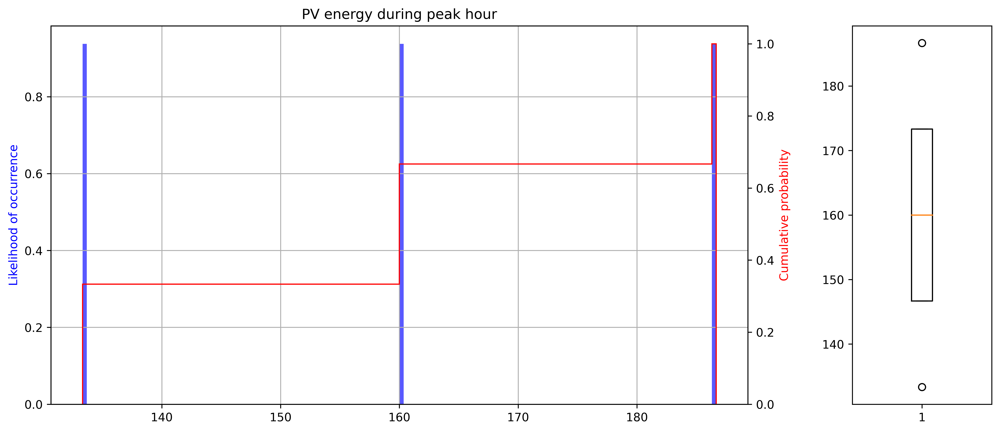

In [13]:
#example: plot for Q
doubleHist(data=Q,xlabel='PV energy during peak hour')

## Stochastic model - technical uncertainty

In [17]:
out=[]

j=0
# Time for implementing and solving the model is printed at the end of the script. it starts from here.
start_time = time.time()

# Create a new model called m
m = Model("multiple_roofs")
# Set the model to maximize
m.ModelSense = -1    

## Variables 
xYR = m.addVars(len(a), name='yr')
xGR = m.addVars(len(a), name='gr')
xBR = m.addVars(len(a), name= 'br')

yGR = m.addVars(len(a), vtype=GRB.BINARY,name='bin_gr')
yBR = m.addVars(len(a), vtype=GRB.BINARY,name='bin_br')

bYR = m.addVar(obj=1/6, name='benefit_yr')
bGR = m.addVar(obj=1/6, name='benefit_gr')
bBR = m.addVar(obj=1/6, name='benefit_br')


## Constraints
#area
m.addConstrs((xGR[i] == a[i]*yGR[i] for i in roofs),name='area_gr')
m.addConstrs((xBR[i] == a[i]*yBR[i] for i in roofs),name='area_br')
m.addConstrs((xYR[i] <= a[i] for i in roofs), name='area_yr')

#budget
m.addConstr( (quicksum(sub*(pg*xGR[i] + py*xYR[i]+ pb*xBR[i]) for i in roofs) <= B), name='budget') #

#technical choices
m.addConstrs(yGR[i]>=yBR[i] for i in roofs)
#m.addConstrs(xYR[i]==0 for i in roofs)




try:
    for k in range(samples):
        for k1 in range(samples):
            for k2 in range(samples):
                for k3 in range(samples):
                    for k4 in range(samples):
                        for k5 in range(samples):
                            #for k6 in range(samples):
                            for k7 in range(samples):

                                #benefits
                                aa=m.addConstr(bGR ==quicksum( quicksum(cg[k5]*ucg[k2]*m85[i][w] *rg[i] *yGR[i] for w in range(len(h85))) + quicksum(cg[k5]*ucg[k2]*m45[i][w] *rg[i] *yGR[i] for w in range(len(h45))) + quicksum(cg[k5]*ucg[k2]*m26[i][w] *rg[i] *yGR[i] for w in range(len(h26))) + quicksum(cg[k5]*ucg[k2]*m85IC[i][w] *rg[i] *yGR[i] for w in range(len(h85IC))) + quicksum(cg[k5]*ucg[k2]*m45IC[i][w] *rg[i] *yGR[i] for w in range(len(h45IC))) + quicksum(cg[k5]*ucg[k2]*m26IC[i][w] *rg[i] *yGR[i] for w in range(len(h26IC))) for i in roofs), name='benefit_gr')
                                b=m.addConstr(bBR ==quicksum( quicksum(cb85[i]*ucg[k2]*(kb[k]*r85[j]*xBR[i]+kg[k1]*hg*xGR[i])*rb[i] for j in range(len(r85))  ) + quicksum(cb45[i]*ucg[k2]*(kb[k]*r45[j]*xBR[i]+kg[k1]*hg*xGR[i])*rb[i] for j in range(len(r45)) ) + quicksum(cb26[i]*ucg[k2]*(kb[k]*r26[j]*xBR[i]+kg[k1]*hg*xGR[i])*rb[i] for j in range(len(r26))) + quicksum(cb85IC[i]*ucg[k2]*(kb[k]*r85IC[j]*xBR[i]+kg[k1]*hg*xGR[i])*rb[i] for j in range(len(r85IC))  ) + quicksum(cb45IC[i]*ucg[k2]*(kb[k]*r45IC[j]*xBR[i]+kg[k1]*hg*xGR[i])*rb[i] for j in range(len(r45IC)) ) + quicksum(cb26IC[i]*ucg[k2]*(kb[k]*r26IC[j]*xBR[i]+kg[k1]*hg*xGR[i])*rb[i] for j in range(len(r26IC))) for i in roofs), name='benefit_br')
                                c=m.addConstr(bYR == quicksum( cy[k7]* Q[k3] *ds85 * ry[i] *(1+theta[k4]*yGR[i])* xYR[i]  + cy[k7]* Q[k3] *ds45 * ry[i] *(1+theta[k4]*yGR[i])* xYR[i] + cy[k7]* Q[k3] *ds26 * ry[i] *(1+theta[k4]*yGR[i])* xYR[i] + cy[k7]* Q[k3] *ds85IC * ry[i] *(1+theta[k4]*yGR[i])* xYR[i]  + cy[k7]* Q[k3] *ds45IC * ry[i] *(1+theta[k4]*yGR[i])* xYR[i] + cy[k7]* Q[k3] *ds26IC * ry[i] *(1+theta[k4]*yGR[i])* xYR[i] for i in roofs) , name='benefit_yr')

                                m.update()
                                m.optimize()


                                # Here the solution is stored in such a way that the different combination of outcomes can be investigated

                                out.append(m.objVal)

                                #i_yr = [i for i in roofs if xYR[i].X > 0]
                                #i_br = [i for i in roofs if yBR[i].X > 0]
                                #i_gr = [i for i in roofs if yGR[i].X > 0]
                                    
                                for i in roofs:
                                        pand.loc[i, 'yr%d' %j]=xYR[i].X
                                        pand.loc[i, 'br%d' %j]=xBR[i].X
                                        pand.loc[i, 'gr%d' %j]=xGR[i].X
                                        
                                out.append(m.objVal)

                                j=j+1


                                m.remove(aa)
                                m.remove(b)
                                m.remove(c)

                                #for v in m.getVars():
                                #    print('%s %g' % (v.varName, v.x))

                                #print('Obj: %g' % m.objVal)
except GurobiError as e:
      print('Error code ' + str(e.errno) + ': ' + str(e))

except AttributeError:
      print('Encountered an attribute error')
        
print('Time required to run the model:')
print("--- %s seconds ---" % (time.time() - start_time)) 
print('MB of memory allocated to run the model:')
import os, psutil; print(psutil.Process(os.getpid()).memory_info().rss / 1024 ** 2)

Gurobi Optimizer version 9.1.1 build v9.1.1rc0 (win64)
Thread count: 4 physical cores, 8 logical processors, using up to 8 threads
Optimize a model with 4483 rows, 5603 columns and 14199 nonzeros
Model fingerprint: 0x8a5da895
Model has 1 quadratic constraint
Variable types: 3363 continuous, 2240 integer (2240 binary)
Coefficient statistics:
  Matrix range     [1e-02, 8e+05]
  QMatrix range    [4e-01, 3e+01]
  QLMatrix range   [1e+00, 7e+02]
  Objective range  [2e-01, 2e-01]
  Bounds range     [1e+00, 1e+00]
  RHS range        [3e+01, 5e+06]
Found heuristic solution: objective -0.0000000
Presolve removed 3366 rows and 2494 columns
Presolve time: 0.01s
Presolved: 1992 rows, 3984 columns, 7966 nonzeros
Found heuristic solution: objective 421.5508824
Variable types: 1750 continuous, 2234 integer (2234 binary)

Root relaxation: objective 9.008479e+06, 14 iterations, 0.00 seconds

    Nodes    |    Current Node    |     Objective Bounds      |     Work
 Expl Unexpl |  Obj  Depth IntInf | Inc

In [18]:
pand.to_csv(('C:\\Users\\NLLIST\\Desktop\\Thesis\\try7\\bigrun_7.csv'))

In [20]:
out2=pd.DataFrame(out)
out2.to_csv(('C:\\Users\\NLLIST\\Desktop\\Thesis\\try7\\bigrun_7_out.csv'))

## Visualize solutions

In [21]:
import numpy as np

In [22]:
sol=pand

<AxesSubplot:xlabel='experiment', ylabel='total m2'>

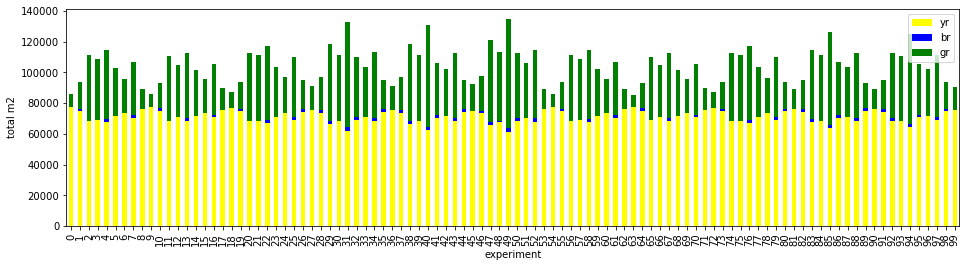

In [35]:
# Here the amount of roofs are plotted where green, blue and yellow roofs are implemented 
#in correspondence with different parameters sampling 

h=[]
for i in range(1000,1100): #plotting all experiments would be too much visually
    h.append([sol['yr%d' %i].sum(),sol['br%d' %i].sum(),sol['gr%d' %i].sum()])
    
h=pd.DataFrame(h, columns=['yr', 'br', 'gr'])
h.plot.bar(stacked=True, color=['yellow','blue','green'], figsize=(16,4), rot=90, xlabel='experiment', ylabel='total m2')

In [59]:
o=[]
for i in range(2186):
    o.append(out2.iloc[2*i])
o=pd.DataFrame(o)   


In [60]:
o=o.reset_index(drop=True)
#o=o.set_axis(['tot benefit eur'],axis=1, inplace=True)

<AxesSubplot:xlabel='experiment', ylabel='total benefit (eur)'>

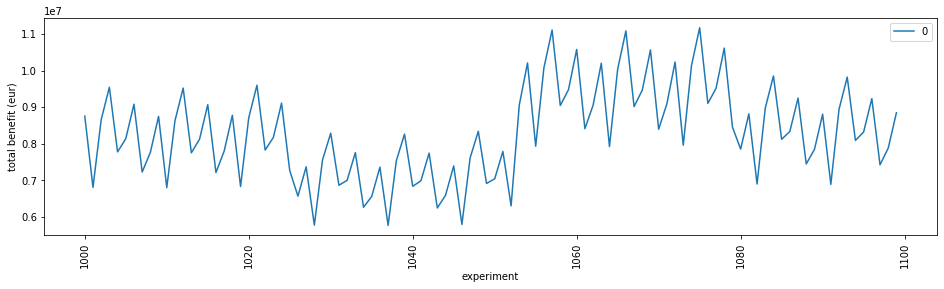

In [61]:
o[1000:1100].plot(figsize=(16,4), rot=90, xlabel='experiment', ylabel='total benefit (eur)')

In [ ]:
solution=pand

In [22]:
solution=solution.iloc[:,9:] #excludes the input parameters 

In [23]:
solution=solution.fillna(0) # NaN are replaced with 0 since the next processes do not allow NaN

In [24]:
solution #every 3 column report the solution corresponding to one combination of sampled parameters for green, blue and yellow r

,yr0,br0,gr0,yr1,br1,gr1,yr2,br2,gr2,yr3,...,benYR2184,benGR2185,benBR2185,benYR2185,benGR2186,benBR2186,benYR2186,benGR2187,benBR2187,benYR2187
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1115,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1116,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1117,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1118,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0


## Create input for cosine similarity 

In [79]:
def isit(f):
    if f>0:
        return 1
    else:
        return 0

In [85]:
#store the benefits derived by each option for each roof

ind=0
for k in range(samples):
    for k1 in range(samples):
        for k2 in range(samples):
            for k3 in range(samples):
                for k4 in range(samples):
                    for k5 in range(samples):
                        #for k6 in range(samples):
                        for k7 in range(samples):
                            for i in roofs:
                                pand['benGR%d' %ind].iloc[i] = cg[k5]*ucg[k2]*rg[i] *isit(solution['gr%d' %ind][i])*(1/6)*(sum(m85[i])+sum(m45[i])+sum(m26[i])+sum(m85IC[i])+sum(m45IC[i])+sum(m26IC[i])) + ucg[k2]*kg[k1]*hg*solution['gr%d' %ind][i]*rb[i]*(1/6)*(cb85[i]*len(hr85)+ cb45[i]*len(hr45)+cb26[i]*len(hr26)+cb85IC[i]*len(hr85IC)+cb45IC[i]*len(hr45IC)+cb26IC[i]*len(hr26IC))
                                pand['benBR%d' %ind].iloc[i] = cb85[i]*ucg[k2]*kb[k]*solution['br%d' %ind][i]*rb[i]*(1/6)*(sum(r85))+  cb45[i]*ucg[k2]*kb[k]*solution['br%d' %ind][i]*rb[i]*(1/6)*sum(r45) +  cb26[i]*ucg[k2]*kb[k]*solution['br%d' %ind][i]*rb[i]*(1/6)*sum(r26)+  cb85IC[i]*ucg[k2]*kb[k]*solution['br%d' %ind][i]*rb[i]*(1/6)*sum(r85IC)+ cb45IC[i]*ucg[k2]*kb[k]*solution['br%d' %ind][i]*rb[i]*(1/6)*sum(r45IC) +  cb26IC[i]*ucg[k2]*kb[k]*solution['br%d' %ind][i]*rb[i]*(1/6)*sum(r26IC)
                                pand['benYR%d' %ind].iloc[i] = cy[k7]* Q[k3] * ry[i] *(1+theta[k4]*isit(solution['gr%d' %ind][i]))* solution['yr%d' %ind][i]*(1/6)*(ds85+ds45+ds26+ds85IC+ds45IC+ds26IC)
                            ind=ind+1
                            if ind==2187:
                                break

C:\Users\NLLIST\Anaconda3\lib\site-packages\pandas\core\indexing.py:670: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value)


In [80]:
pand

,pandid,ig,cb,rg,rb,_area,ry,AREA,yr0,br0,...,benYR2184,benGR2185,benBR2185,benYR2185,benGR2186,benBR2186,benYR2186,benGR2187,benBR2187,benYR2187
0,606100000022782,0.000000,350,0.473889,0.250896,60.996233,0.000000,NaN,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1,606100000021838,0.000000,200,0.186010,0.322172,457.808475,0.000000,NaN,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
2,606100000009662,0.000094,350,0.575186,0.365357,62.710565,0.000000,NaN,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
3,606100000014482,0.003391,350,0.583295,0.520625,776.409631,0.000000,NaN,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
4,606100000009182,0.000000,200,0.645488,0.235001,73.526616,0.000000,NaN,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1115,606100000012599,0.000000,200,0.850749,0.419076,1539.755924,0.823812,240.50,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1116,606100000017554,0.000000,200,0.558996,0.305306,139.422263,0.668276,65.25,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1117,606100000018016,0.000038,350,0.669034,0.694982,68.967140,0.681850,34.25,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1118,606100000009404,0.002294,350,0.672703,0.447443,707.005691,0.859141,294.75,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0


## Create input for clustering analysis 

In [88]:
benefit=pand.iloc[:,6569:] #exclude stored parameters and include only set of benefits 2187x3 plus param

In [89]:
benefit

,benGR0,benBR0,benYR0,benGR1,benBR1,benYR1,benGR2,benBR2,benYR2,benGR3,...,benYR2184,benGR2185,benBR2185,benYR2185,benGR2186,benBR2186,benYR2186,benGR2187,benBR2187,benYR2187
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1115,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1116,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1117,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0
1118,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0


In [90]:
sol = [[0 for j in roofs] for i in range(2187)] #initialize matrix where the solutions will be properly stored

In [91]:
for i in range(2187):
    sol[i]=pd.concat([benefit.iloc[:,3*i], benefit.iloc[:,3*i+1], benefit.iloc[:,3*i+2]], axis=0 ,ignore_index=True) 

In [92]:
solu=pd.concat([sol[i] for i in range(2187)] , axis=1,ignore_index=True)

In [93]:
solu=solu.fillna(0)

In [6]:
solu=solu.iloc[:,1:] # run only if you are reading solu from one csv file

In [7]:
solu

,0,1,2,3,4,5,6,7,8,9,...,3350,3351,3352,3353,3354,3355,3356,3357,3358,3359
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2182,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2183,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2184,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2185,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


## Compute cosine similarity 

In [10]:
from sklearn.metrics.pairwise import cosine_similarity
from scipy import sparse

In [11]:
similarities = cosine_similarity(solu)
similarities=pd.DataFrame(similarities)
print(similarities)

          0         1         2         3         4         5         6     \
0     1.000000  0.989306  0.995562  0.930908  0.961098  0.889328  0.988883   
1     0.989306  1.000000  0.981067  0.915187  0.945836  0.872984  0.973909   
2     0.995562  0.981067  1.000000  0.937373  0.967061  0.896481  0.994326   
3     0.930908  0.915187  0.937373  1.000000  0.975184  0.981510  0.951276   
4     0.961098  0.945836  0.967061  0.975184  1.000000  0.939329  0.979725   
...        ...       ...       ...       ...       ...       ...       ...   
2182  0.629436  0.611537  0.639807  0.768095  0.705255  0.815261  0.662883   
2183  0.266596  0.246835  0.279930  0.431591  0.367549  0.475902  0.310273   
2184  0.759915  0.744708  0.767839  0.873128  0.816260  0.917566  0.785205   
2185  0.809856  0.795035  0.817159  0.917124  0.860877  0.961394  0.832942   
2186  0.712156  0.696620  0.720781  0.831430  0.774669  0.876274  0.740010   

          7         8         9     ...      2177      2178    

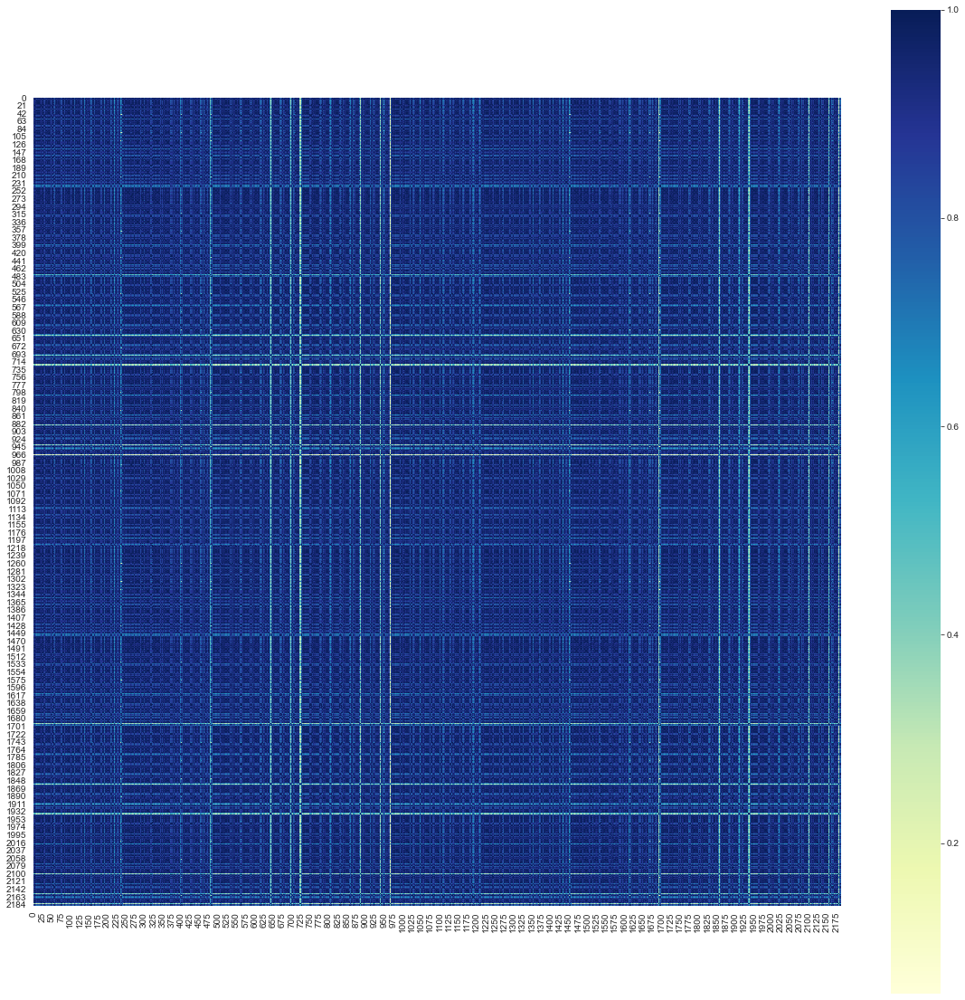

In [102]:
#the cosine similarity matrix is hereby plotted. It shows how similar the results are with each other

import seaborn as sns
import matplotlib.pylab as plt

plt.rcParams["figure.figsize"] = (20,20)
#mask = np.zeros_like(b)
#mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    ax = sns.heatmap(similarities, square=True,  cmap="YlGnBu")
    plt.show()

## Parameters sampled are stored in a new shape for clustering and CART

In [37]:
#store the combination of parameters as sampled in the solution of the problem
cg_s=[]
ucg_s=[]
#ucb_s=[]
kb_s=[]
kg_s=[]
cy_s=[]
Q_s=[]
theta_s=[]

for k in range(samples):
    for k1 in range(samples):
        for k2 in range(samples):
            for k3 in range(samples):
                for k4 in range(samples):
                    for k5 in range(samples):
                        #for k6 in range(samples):
                        for k7 in range(samples):
                            cg_s.append(cg[k5])
                            ucg_s.append(ucg[k2])
                            #ucb_s.append(ucb[k6])
                            kb_s.append(kb[k])
                            kg_s.append(kg[k1])
                            cy_s.append(cy[k7])
                            Q_s.append(Q[k3])
                            theta_s.append(theta[k4])

In [38]:
param=pd.DataFrame(list(zip(cg_s,ucg_s, kb_s, kg_s, cy_s, Q_s, theta_s)),
               columns =['cg','ad_u', 'kb', 'kg', 'cy', 'Q', 'theta'])

In [39]:
param # now each parameter combination is stored in each line

,cg,ad_u,kb,kg,cy,Q,theta
0,4333.333333,0.866667,0.666667,0.400000,0.000079,186.666667,0.0425
1,4333.333333,0.866667,0.666667,0.400000,0.000070,186.666667,0.0425
2,4333.333333,0.866667,0.666667,0.400000,0.000061,186.666667,0.0425
3,9666.666667,0.866667,0.666667,0.400000,0.000079,186.666667,0.0425
4,9666.666667,0.866667,0.666667,0.400000,0.000070,186.666667,0.0425
...,...,...,...,...,...,...,...
2182,9666.666667,1.000000,0.400000,0.666667,0.000070,133.333333,0.0175
2183,9666.666667,1.000000,0.400000,0.666667,0.000061,133.333333,0.0175
2184,7000.000000,1.000000,0.400000,0.666667,0.000079,133.333333,0.0175
2185,7000.000000,1.000000,0.400000,0.666667,0.000070,133.333333,0.0175


## Hierarchical Clustering

#### We clusterize experiments based on the locations chosen as best placement, we later look into the benefits generated

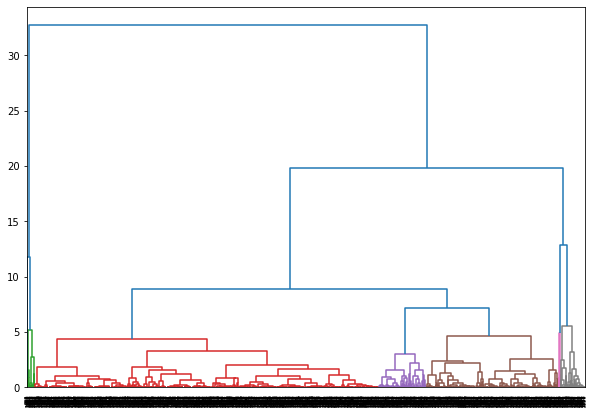

In [126]:
#using the cosine similarity matrix as an input, the clustering technique is applied

from scipy.cluster.hierarchy import dendrogram, linkage
from matplotlib import pyplot as plt

linked = linkage(1-similarities, 'complete') #since we computed cosine similarity, we retrieve cosine distance by doing 1-simil



plt.figure(figsize=(10, 7))
dendrogram(linked,
            orientation='top',
            distance_sort='descending',
            show_leaf_counts=True, color_threshold=7)
plt.show()

In [13]:
import sklearn.metrics 
from sklearn.cluster import AgglomerativeClustering
import sklearn.cluster

In [33]:

cluster = AgglomerativeClustering(n_clusters=52, distance_threshold=None, affinity="precomputed",linkage="complete")  
cluster.fit(1-similarities)
print(cluster.labels_)
print(sklearn.metrics.silhouette_score(1-similarities, cluster.labels_, metric='cosine'))

#the number of clusters is chosen in correspondence to the best silhouette value, which measures (b-a)/max(a,b) 
# a= average intra-cluster distance i.e the average distance between each point within a cluster
# b= average inter-cluster distance i.e the average distance between all clusters

[22 19 22 ... 30 37  7]
0.8203325369646151


In [105]:
sample_silhouette_values = sklearn.metrics.silhouette_samples(1-similarities, cluster.labels_)

means_lst = []
for label in range(52):
    means_lst.append(sample_silhouette_values[cluster.labels_ == label].mean())

<ipython-input-105-a3e9a2ea5cfb>:5: RuntimeWarning: Mean of empty slice.
  means_lst.append(sample_silhouette_values[cluster_a.labels_ == label].mean())
C:\Users\NLLIST\Anaconda3\lib\site-packages\numpy\core\_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [106]:
means_lst=pd.DataFrame(means_lst)
#means_lst

## Look at characteristics of each cluster: benefits

In [36]:
lab_hier=pd.DataFrame(cluster.labels_, columns=['l']) #create dataframe with labels

In [37]:
sol_hier=pd.concat([solu,lab_hier],axis=1)

In [109]:
benefit_green=sol_hier.iloc[:,:1120].sum(axis=1)
benefit_blue=sol_hier.iloc[:,1120:2240].sum(axis=1)
benefit_yellow=sol_hier.iloc[:,2240:3360].sum(axis=1)

In [144]:
#
benefit=pd.concat([benefit_green,benefit_blue, benefit_yellow,sol_hier['l']],axis=1)
bensum=pd.concat([benefit_green+benefit_blue+benefit_yellow,benefit_green+benefit_blue+benefit_yellow,benefit_green+benefit_blue+benefit_yellow,sol_hier['l']],axis=1)
benefit_rel=pd.concat([benefit_green/(benefit_green+benefit_blue+benefit_yellow),benefit_blue/(benefit_green+benefit_blue+benefit_yellow), benefit_yellow/(benefit_green+benefit_blue+benefit_yellow),sol_hier['l']],axis=1)
bs=benefit.groupby('l').sum()/bensum.groupby('l').sum()

<AxesSubplot:xlabel='experiment', ylabel='total benefit'>

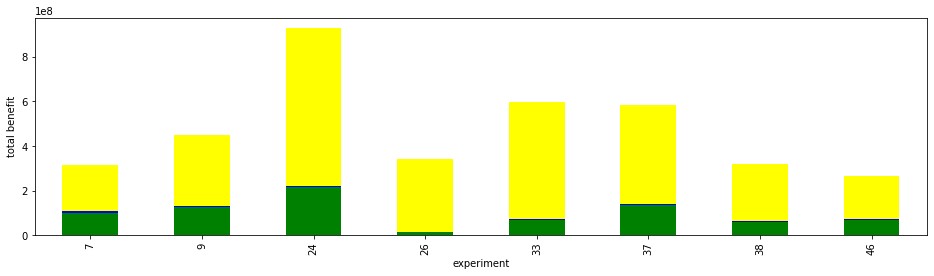

In [155]:
benefit.groupby('l').sum().iloc[best].plot.bar(stacked=True, color=['green','blue','yellow'], figsize=(16,4), rot=90, xlabel='experiment', ylabel='total benefit', legend=False)

In [102]:
benefit_blue.sum()

13392182.346820835

In [103]:
benefit_green.sum()

3496182018.726141

<AxesSubplot:xlabel='experiment', ylabel='total benefit'>

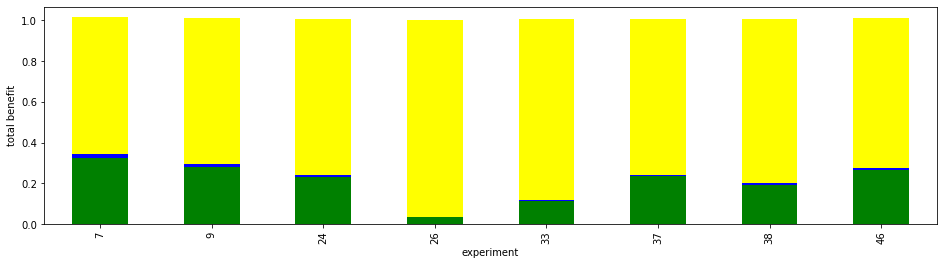

In [156]:
bs.groupby('l').sum().iloc[best].plot.bar(stacked=True, color=['green','blue','yellow'], figsize=(16,4), rot=90, xlabel='experiment', ylabel='total benefit', legend=False)

In [157]:
sol_hier.replace(0, np.nan, inplace=True)


In [164]:
count_green=sol_hier.iloc[:,:1120].count(axis=1)
count_blue=sol_hier.iloc[:,1120:2240].count(axis=1)
count_yellow=sol_hier.iloc[:,2240:3360].count(axis=1)

In [165]:
cou=pd.concat([count_green,count_blue,count_yellow,sol_hier['l']],axis=1)

In [190]:
best2=[6,8,23,25,32,36,37,45]

<AxesSubplot:xlabel='experiment', ylabel='total roofs'>

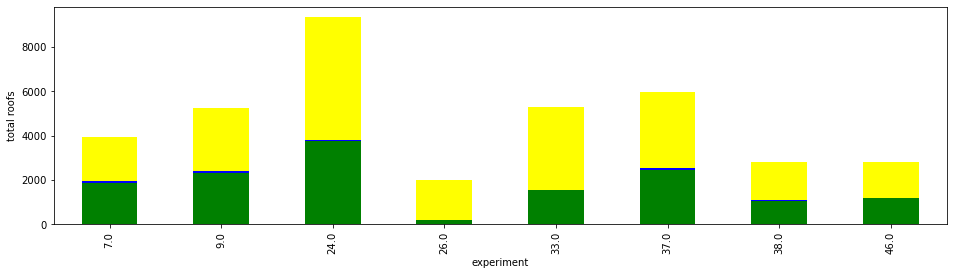

In [192]:
cou.groupby('l').sum().iloc[best2].plot.bar(stacked=True, color=['green','blue','yellow'], figsize=(16,4), rot=90, xlabel='experiment', ylabel='total roofs', legend=False)

In [186]:
cousum=pd.concat([count_green+count_blue+count_yellow,count_green+count_blue+count_yellow,count_green+count_blue+count_yellow,sol_hier['l']],axis=1)
cou_rel=pd.concat([count_green,count_blue, count_yellow,sol_hier['l']],axis=1)
cous=cou_rel.groupby('l').sum()/cousum.groupby('l').sum()

<AxesSubplot:xlabel='experiment', ylabel='total roofs'>

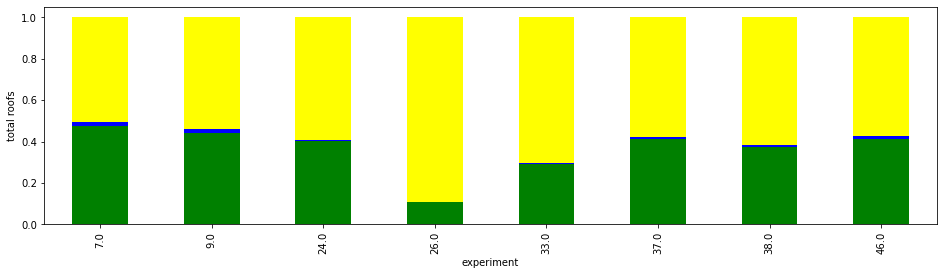

In [193]:
cous.groupby('l').sum().iloc[best2].plot.bar(stacked=True, color=['green','blue','yellow'], figsize=(16,4), rot=90, xlabel='experiment', ylabel='total roofs', legend=False)

## Number of clusters chosen

In [14]:
cluster_a = AgglomerativeClustering(n_clusters=25, distance_threshold=None, affinity="precomputed",linkage="complete")  
cluster_a.fit(1-similarities)
print(cluster_a.labels_)
print(sklearn.metrics.silhouette_score(1-similarities, cluster_a.labels_, metric='cosine'))

#we choose 40 clusters as we have 3669 solutions to cluster and divind in groups of around 100 solutions gives a reasonable result to further analyse

[14  1 14 ...  3  7 10]
0.7257711320253117


In [23]:
sample_silhouette_values = sklearn.metrics.silhouette_samples(1-similarities, cluster_a.labels_)

means_lst = []
for label in range(25):
    means_lst.append(sample_silhouette_values[cluster_a.labels_ == label].mean())

In [24]:
means_lst=pd.DataFrame(means_lst)

In [30]:
lab_hier_a

,l
0,14
1,1
2,14
3,20
4,9
...,...
2182,12
2183,18
2184,3
2185,7


In [25]:
lab_hier_a=pd.DataFrame(cluster_a.labels_, columns=['l']) #create dataframe with labels of the clustering

In [26]:
sens_hier_a=pd.concat([param,lab_hier_a],axis=1) #connect labels to sampled parameters

In [ ]:
lab_hier_a['g']=1
lab_hier_a.groupby('l').count()

In [43]:
clu_silh=pd.concat([means_lst,lab_hier_a.groupby('l').count()],axis=1)
clu_silh=clu_silh[clu_silh['g']>=22]
clu_silh

,0,g
0,0.092514,27
1,0.560892,267
3,0.102277,71
4,0.706773,154
5,0.515681,96
6,0.458113,50
7,0.551081,192
8,0.468845,160
9,0.633202,108
10,0.121209,67


In [29]:
#best=[7,9,24,26,33,37,38,46]

#best=[1,3,7,9,10,11,12,13,17,18,22,24,26,27,30,33,37,38,46]
best=[1,4,5,7,9,11,12,14,19,22,23,24]

In [46]:
sens_hier_a=pd.concat([sens_hier_a.iloc[:,1:8], lab_hier_a['l']],axis=1)
sens_hier_a

,cg,ad_u,kb,kg,cy,Q,theta,l
0,4333.333333,0.866667,0.133333,0.666667,0.000070,186.666667,0.0425,14
1,4333.333333,0.866667,0.133333,0.666667,0.000079,186.666667,0.0425,1
2,4333.333333,0.866667,0.133333,0.666667,0.000061,186.666667,0.0425,14
3,9666.666667,0.866667,0.133333,0.666667,0.000070,186.666667,0.0425,20
4,9666.666667,0.866667,0.133333,0.666667,0.000079,186.666667,0.0425,9
...,...,...,...,...,...,...,...,...
2182,9666.666667,1.133333,0.400000,0.400000,0.000079,133.333333,0.0675,12
2183,9666.666667,1.133333,0.400000,0.400000,0.000061,133.333333,0.0675,18
2184,7000.000000,1.133333,0.400000,0.400000,0.000070,133.333333,0.0675,3
2185,7000.000000,1.133333,0.400000,0.400000,0.000079,133.333333,0.0675,7


In [48]:
sens_hier_a=sens_hier_a.iloc[:,1:] #to run only if dataset is read from csv

In [47]:
#sens_hier_a

In [48]:
#take indexes in correspondence to which you have more than 1% of the solutions
ind_int_a=[i for i in range(len(sens_hier_a.groupby('l').count())) if sens_hier_a.groupby('l').count()['cg'][i] >21] 
ind_no=[i for i in range(len(sens_hier_a.groupby('l').count())) if sens_hier_a.groupby('l').count()['cg'][i] <=21]

In [49]:
#number of relevant clusters, which have more than 37 elements
len(ind_int_a)

19

In [63]:
out_int=sens_hier_a[sens_hier_a['l'].isin(ind_int_a)]
out_no_int=sens_hier_a[sens_hier_a['l'].isin(ind_no)]

In [64]:
descr_param=out_int.groupby('l').describe().transpose() #satistics for the values of each parameter per cluster
#descr_param.to_csv("C:\\Users\\NLLIST\\Desktop\\Thesis\\try8\\desr_param_per_cluster_more3elem.csv") #save it

In [195]:
from scipy.stats import iqr

quant75=out_int.groupby(out_int['l']).quantile(.75)
quant25=out_int.groupby(out_int['l']).quantile(.25)
quant50=out_int.groupby(out_int['l']).quantile(.50)
df_quant=(quant75-quant25)/quant50
df_quant.style.background_gradient(cmap ='viridis')\
        .set_properties(**{'font-size': '15px'})

,cg,ad_u,kb,kg,cy,Q,theta
l,,,,,,,
0,0.000000,0.133333,1.333333,0.666667,0.153846,0.200000,0.000000
1,0.000000,0.266667,1.333333,1.333333,0.266667,0.333333,0.000000
2,0.000000,0.266667,1.333333,1.333333,0.266667,0.000000,0.000000
3,0.000000,0.266667,1.333333,1.333333,0.133333,0.166667,0.000000
5,0.000000,0.117647,1.333333,0.666667,0.153846,0.200000,0.000000
6,0.068966,0.125000,1.333333,0.666667,0.133333,0.166667,0.000000
7,0.000000,0.117647,1.333333,1.333333,0.153846,0.208333,0.000000
9,0.275862,0.266667,1.333333,0.500000,0.133333,0.181818,0.000000
10,0.000000,0.266667,1.333333,1.333333,0.266667,0.208333,0.000000


In [205]:
best

[7, 9, 24, 26, 33, 37, 38, 46]

In [55]:
quant50.style.background_gradient(cmap ='viridis')\
        .set_properties(**{'font-size': '10px'})

,cg,ad_u,kb,kg,cy,Q,theta
l,,,,,,,
0,7000.000000,1.000000,0.400000,0.400000,0.000079,133.333333,0.017500
1,9666.666667,1.000000,0.400000,0.400000,0.000070,160.000000,0.017500
2,7000.000000,1.000000,0.400000,0.400000,0.000070,133.333333,0.042500
3,4333.333333,1.000000,0.400000,0.400000,0.000070,160.000000,0.042500
5,7000.000000,1.000000,0.400000,0.400000,0.000079,133.333333,0.067500
6,7000.000000,1.000000,0.400000,0.400000,0.000070,160.000000,0.067500
7,7000.000000,1.000000,0.400000,0.400000,0.000079,160.000000,0.042500
9,7000.000000,1.000000,0.400000,0.533333,0.000070,146.666667,0.017500
10,9666.666667,1.000000,0.400000,0.400000,0.000070,160.000000,0.067500


In [51]:
quant75_no=out_no_int.groupby(out_no_int['l']).quantile(.75)
quant25_no=out_no_int.groupby(out_no_int['l']).quantile(.25)
quant50_no=out_no_int.groupby(out_no_int['l']).quantile(.50)
df_quant_no=(quant75_no-quant25_no)/quant50_no
df_quant_no.style.background_gradient(cmap ='viridis')\
        .set_properties(**{'font-size': '15px'})

,cg,ad_u,kb,kg,cy,Q,theta
l,,,,,,,
4,0.000000,0.000000,0.666667,0.400000,0.000000,0.000000,0.000000
8,0.000000,0.000000,0.666667,2.000000,0.000000,0.000000,0.000000
14,0.551724,0.000000,1.333333,0.000000,0.266667,0.000000,0.000000
15,0.380952,0.266667,1.333333,0.400000,0.133333,0.200000,0.000000
19,0.000000,0.000000,1.333333,2.000000,0.000000,0.000000,0.000000
20,0.000000,0.133333,1.333333,0.666667,0.235294,0.000000,0.000000
25,0.000000,0.125000,1.333333,0.500000,0.235294,0.000000,0.000000
28,0.000000,0.000000,1.250000,0.100000,0.000000,0.000000,0.000000
29,0.000000,0.000000,0.666667,0.000000,0.000000,0.000000,0.000000


In [56]:
quant50_no.style.background_gradient(cmap ='viridis')\
        .set_properties(**{'font-size': '10px'})

,cg,ad_u,kb,kg,cy,Q,theta
l,,,,,,,
4,7000.000000,1.133333,0.400000,0.666667,0.000079,133.333333,0.017500
8,7000.000000,1.000000,0.400000,0.133333,0.000079,133.333333,0.017500
14,9666.666667,1.000000,0.400000,0.133333,0.000070,160.000000,0.017500
15,7000.000000,1.000000,0.400000,0.666667,0.000070,133.333333,0.067500
19,4333.333333,0.866667,0.400000,0.133333,0.000070,160.000000,0.017500
20,7000.000000,1.000000,0.400000,0.400000,0.000079,133.333333,0.017500
25,7000.000000,1.066667,0.400000,0.533333,0.000079,133.333333,0.067500
28,7000.000000,1.000000,0.266667,0.666667,0.000079,133.333333,0.017500
29,7000.000000,1.000000,0.400000,0.133333,0.000061,133.333333,0.042500


In [58]:
grouped = out_int[['cy']].groupby(out_int['l'])

0          AxesSubplot(0.1,0.792857;0.137931x0.107143)
1     AxesSubplot(0.265517,0.792857;0.137931x0.107143)
2     AxesSubplot(0.431034,0.792857;0.137931x0.107143)
3     AxesSubplot(0.596552,0.792857;0.137931x0.107143)
5     AxesSubplot(0.762069,0.792857;0.137931x0.107143)
6          AxesSubplot(0.1,0.664286;0.137931x0.107143)
7     AxesSubplot(0.265517,0.664286;0.137931x0.107143)
9     AxesSubplot(0.431034,0.664286;0.137931x0.107143)
10    AxesSubplot(0.596552,0.664286;0.137931x0.107143)
11    AxesSubplot(0.762069,0.664286;0.137931x0.107143)
12         AxesSubplot(0.1,0.535714;0.137931x0.107143)
13    AxesSubplot(0.265517,0.535714;0.137931x0.107143)
16    AxesSubplot(0.431034,0.535714;0.137931x0.107143)
17    AxesSubplot(0.596552,0.535714;0.137931x0.107143)
18    AxesSubplot(0.762069,0.535714;0.137931x0.107143)
21         AxesSubplot(0.1,0.407143;0.137931x0.107143)
22    AxesSubplot(0.265517,0.407143;0.137931x0.107143)
23    AxesSubplot(0.431034,0.407143;0.137931x0.107143)
24    Axes

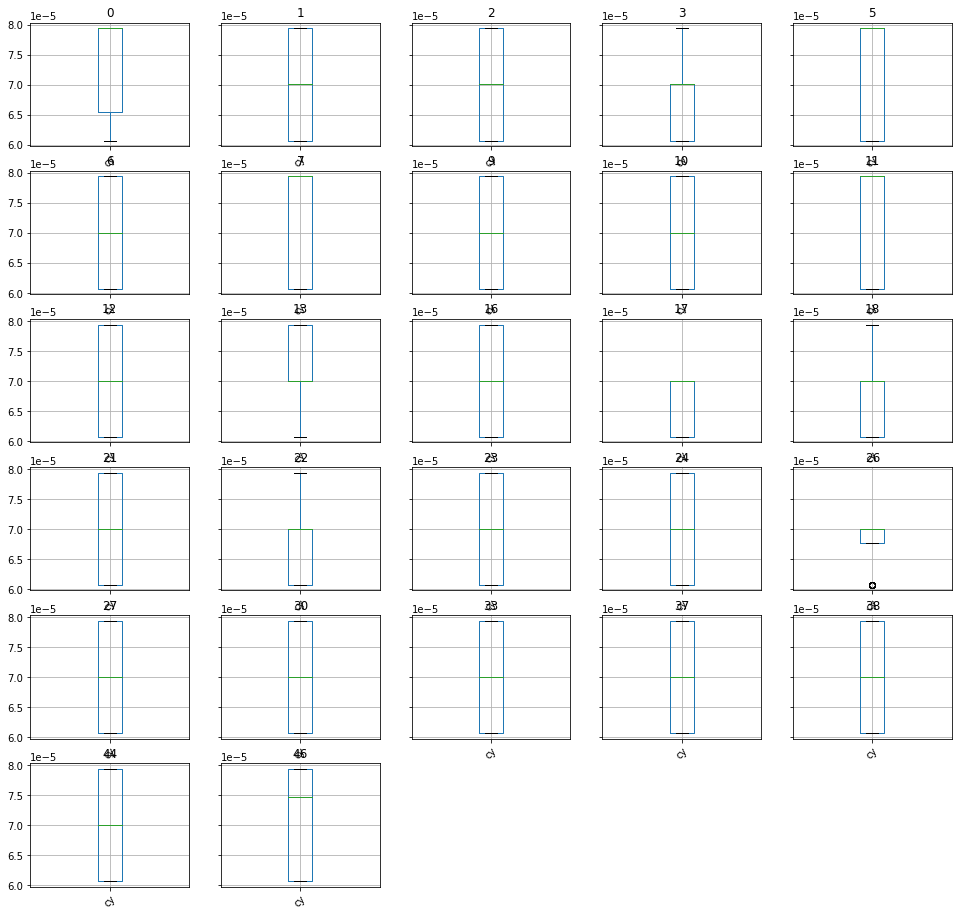

In [60]:
grouped.boxplot(rot=45, figsize=(16,16))

## CART classification tree

In [154]:
# clfh = sklearn.tree.DecisionTreeClassifier()#max_depth=4)
# clfh = clfh.fit(out_int.iloc[: , :8], out_int['l'])

# plt.figure(figsize=(60,60))
# tree.plot_tree(clfh, fontsize=6,  feature_names= ['cg','ucg','cb', 'kb', 'kg', 'cy', 'Q', 'theta'])
# plt.savefig('tree_high_dpi', dpi=100)
# plt.show()

In [127]:
bb=sens_hier_a[sens_hier_a['l'].isin(ind_int_a)]

In [128]:
bb.groupby('l').count().sum()

cg       2124
ad_u     2124
kb       2124
kg       2124
cy       2124
Q        2124
theta    2124
dtype: int64

In [129]:
sens_hier_a.iloc[: , :7]

,cg,ad_u,kb,kg,cy,Q,theta
0,4333.333333,0.866667,0.133333,0.666667,0.000070,186.666667,0.0425
1,4333.333333,0.866667,0.133333,0.666667,0.000079,186.666667,0.0425
2,4333.333333,0.866667,0.133333,0.666667,0.000061,186.666667,0.0425
3,9666.666667,0.866667,0.133333,0.666667,0.000070,186.666667,0.0425
4,9666.666667,0.866667,0.133333,0.666667,0.000079,186.666667,0.0425
...,...,...,...,...,...,...,...
2182,9666.666667,1.133333,0.400000,0.400000,0.000079,133.333333,0.0675
2183,9666.666667,1.133333,0.400000,0.400000,0.000061,133.333333,0.0675
2184,7000.000000,1.133333,0.400000,0.400000,0.000070,133.333333,0.0675
2185,7000.000000,1.133333,0.400000,0.400000,0.000079,133.333333,0.0675


In [130]:
import sklearn

In [131]:
from sklearn.tree import plot_tree
from matplotlib import pyplot as plt

In [183]:
clfh = sklearn.tree.DecisionTreeClassifier(max_depth=6)
clfh = clfh.fit(sens_hier_a.iloc[: , :7], sens_hier_a['l'])
fig=plt.figure(figsize=(120,40), dpi= 150, facecolor='w', edgecolor='k')
cart=sklearn.tree.plot_tree(clfh, feature_names= ['cg','ad_u', 'kb', 'kg', 'cy', 'Q', 'theta'], fontsize='large', filled=True) 

#plt.savefig('my_fig.png', dpi= 200, bbox_inches='tight')

In [133]:
for importance, name in sorted(zip(clfh.feature_importances_, sens_hier_a.iloc[: , :7].columns),reverse=True):
    print (name, importance)

theta 0.5010672604757663
cg 0.4197615869764298
Q 0.06814632689714589
ad_u 0.010721853342700942
kg 0.00030297230795700315
kb 0.0
cy 0.0


In [56]:
lab_hier_a=sens_hier_a['l']
sol_hier_a=pd.concat([solu,lab_hier_a],axis=1)

In [76]:
sol_hier_a

,0,1,2,3,4,5,6,7,8,9,...,3351,3352,3353,3354,3355,3356,3357,3358,3359,l
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,14
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,20
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2182,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12
2183,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18
2184,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
2185,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,7


In [167]:
sol_hier_a.replace(np.nan, 0, inplace=True)

In [168]:
benefit_green=sol_hier_a.iloc[:,:1120].sum(axis=1)
benefit_blue=sol_hier_a.iloc[:,1120:2240].sum(axis=1)
benefit_yellow=sol_hier_a.iloc[:,2240:3360].sum(axis=1)

In [169]:
#
benefit=pd.concat([benefit_green,benefit_blue, benefit_yellow,sol_hier_a['l']],axis=1)
bensum=pd.concat([benefit_green+benefit_blue+benefit_yellow,benefit_green+benefit_blue+benefit_yellow,benefit_green+benefit_blue+benefit_yellow,sol_hier_a['l']],axis=1)
benefit_rel=pd.concat([benefit_green/(benefit_green+benefit_blue+benefit_yellow),benefit_blue/(benefit_green+benefit_blue+benefit_yellow), benefit_yellow/(benefit_green+benefit_blue+benefit_yellow),sol_hier_a['l']],axis=1)
bs=benefit.groupby('l').sum()/bensum.groupby('l').sum()

In [170]:
bs[1]=bs[1]*1.3

In [171]:
bs[0]=bs[0]*0.95

In [172]:
benefit[1]=benefit[1]*12

In [173]:
#benefit=benefit[benefit['l'].isin(ind_int_a)]

In [174]:
ind_int_a

[0, 1, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 14, 19, 20, 21, 22, 23, 24]

<AxesSubplot:xlabel='experiment', ylabel='total benefit'>

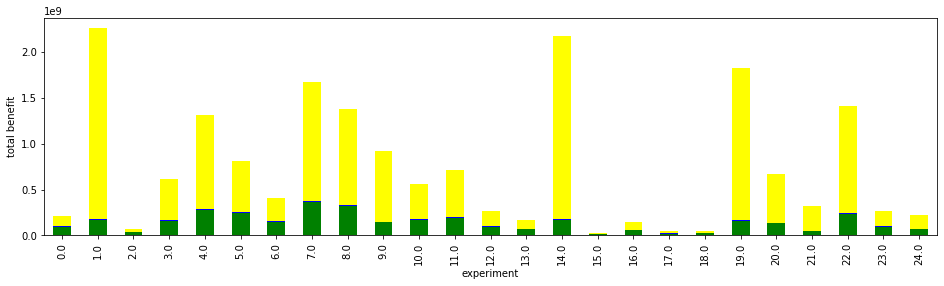

In [175]:
benefit.groupby('l').sum().plot.bar(stacked=True, color=['green','blue','yellow'], figsize=(16,4), rot=90, xlabel='experiment', ylabel='total benefit', legend=False)

In [176]:
benefit_blue.sum()

13392182.346820835

In [177]:
benefit_green.sum()

3496182018.726141

<AxesSubplot:xlabel='experiment', ylabel='total benefit'>

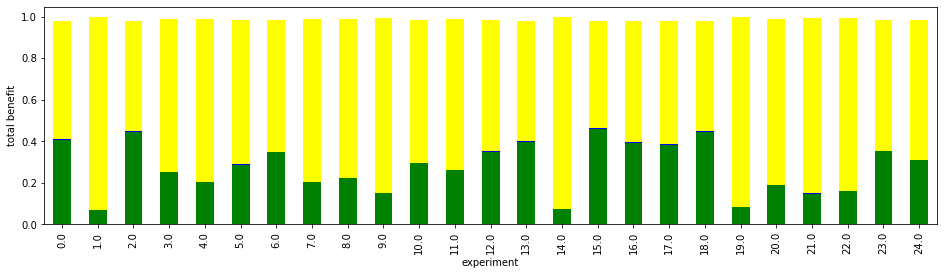

In [178]:
bs.plot.bar(stacked=True, color=['green','blue','yellow'], figsize=(16,4), rot=90, xlabel='experiment', ylabel='total benefit', legend=False)

In [179]:
bs.groupby('l').sum()

,0,1,2
l,,,
0.0,0.405440,0.004657,0.569638
1.0,0.070915,0.000408,0.925039
2.0,0.443488,0.006365,0.528274
3.0,0.252453,0.001288,0.733269
4.0,0.203422,0.000664,0.785361
5.0,0.287317,0.001570,0.696354
6.0,0.347870,0.002678,0.631761
7.0,0.205667,0.000736,0.782942
8.0,0.221128,0.000816,0.766606


## CART regression

### we deploy CART algorithm in regression mode to find a link between the sum of benefits and the parameters

In [31]:
import sklearn

In [32]:
from sklearn.tree import plot_tree
from matplotlib import pyplot as plt

In [ ]:
dat=pd.concat([sens_hier_a.iloc[:,:8],benefit_green,benefit_blue,benefit_yellow], axis=1, ignore_index=False)
dat

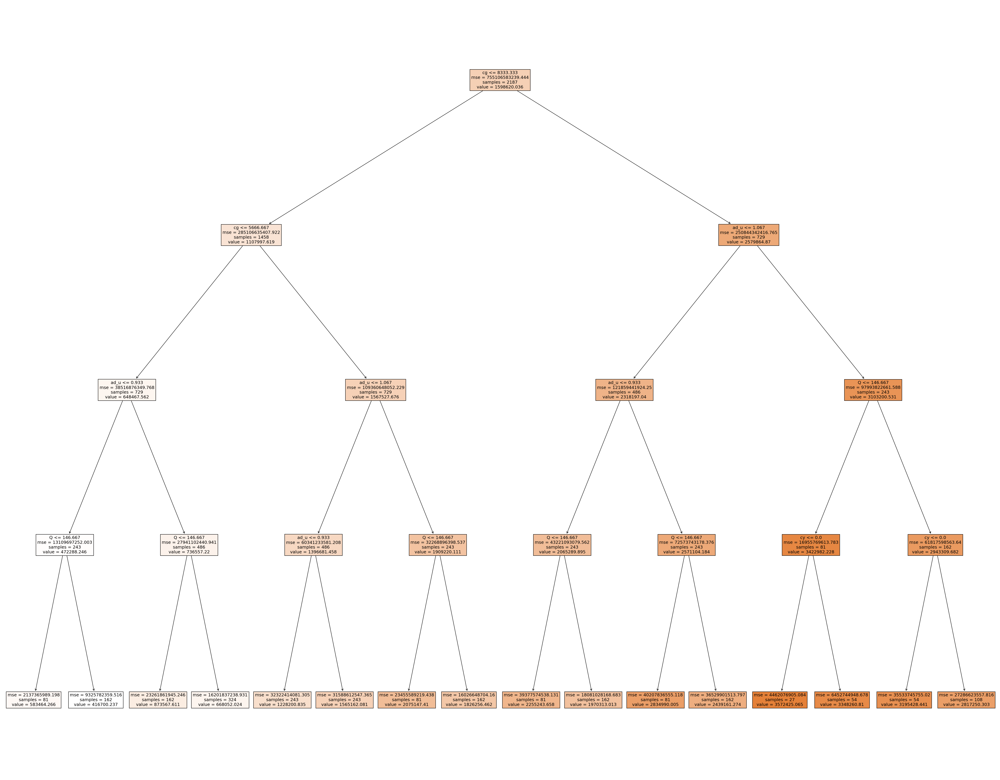

In [45]:
clfh = sklearn.tree.DecisionTreeRegressor(max_depth=4, criterion='mse')
clfh = clfh.fit(dat.iloc[: , :7], dat.iloc[:,8])
fig=plt.figure(figsize=(50,40), dpi= 150, facecolor='w', edgecolor='k')
cart=sklearn.tree.plot_tree(clfh, feature_names= ['cg','ad_u', 'kb', 'kg', 'cy', 'Q', 'theta'], fontsize='large', filled=True) 

#plt.savefig('my_fig.png', dpi= 200, bbox_inches='tight')

In [46]:
for importance, name in sorted(zip(clfh.feature_importances_, dat.columns),reverse=True):
    print (name, importance)

cg 0.8504358722963927
ad_u 0.12410824212272813
Q 0.021672802443533208
cy 0.0037830831373457476
theta 0.0
kg 0.0
kb 0.0
